import libraries 

In [1]:
import numpy as np
import pandas as pd 
import seaborn as sns 
import matplotlib.pyplot as plt
import os

import warnings
warnings.filterwarnings('ignore')
import kagglehub



### Data Preparation

download dataset di kaggle

In [3]:
# download data dari kaggle
path = kagglehub.dataset_download("yasserh/breast-cancer-dataset")

print("Path to dataset files:", path)

Path to dataset files: C:\Users\rizki\.cache\kagglehub\datasets\yasserh\breast-cancer-dataset\versions\1


load data csv

In [2]:
df=pd.read_csv("C:/Users/rizki/.cache/kagglehub/datasets/yasserh/breast-cancer-dataset/versions/1/breast-cancer.csv")
df.columns



Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

cek 5 data teratas

In [5]:
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


### Data Cleaning

cek duplikat

In [4]:
df.duplicated().sum()

0

cek missing value

In [6]:
#cek null pada dataframe
df.isnull().sum()

id                         0
diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

cek ukuran dataframe

In [7]:
df.shape

(569, 32)

cek jumlah data keseluruhan

In [8]:
df.size

18208

berdasarkan hasil cek data tidak memiliki missing value dan duplicate value

### EDA

cek unique value

In [9]:
# melihat nilai unik setiap variabel
df.nunique()

id                         569
diagnosis                    2
radius_mean                456
texture_mean               479
perimeter_mean             522
area_mean                  539
smoothness_mean            474
compactness_mean           537
concavity_mean             537
concave points_mean        542
symmetry_mean              432
fractal_dimension_mean     499
radius_se                  540
texture_se                 519
perimeter_se               533
area_se                    528
smoothness_se              547
compactness_se             541
concavity_se               533
concave points_se          507
symmetry_se                498
fractal_dimension_se       545
radius_worst               457
texture_worst              511
perimeter_worst            514
area_worst                 544
smoothness_worst           411
compactness_worst          529
concavity_worst            539
concave points_worst       492
symmetry_worst             500
fractal_dimension_worst    535
dtype: i

drop id karna tidak memiliki korelasi apapun

In [10]:
# menghilangkan id dari df
df=df.drop('id',axis=1)

merangkum Statistik deskriptif pada dataframe

In [11]:
df.describe()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


### Univariate Analysis


visualisasi fitur kategorikal

<Axes: xlabel='diagnosis', ylabel='count'>

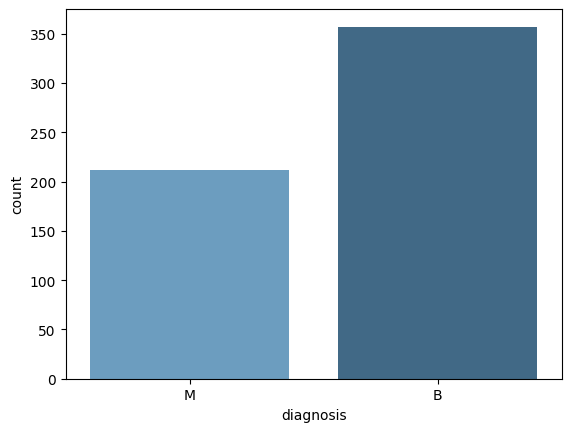

In [3]:
# membuat visualisasi bar chart
sns.countplot(x='diagnosis',data=df,palette='Blues_d')

berdasarkan gambar diatas bahwa nilai benign lebih banyak dari malignant.

### Multivariate Analysis

visualisasi fitur numerikal

In [4]:
# menghilangkan  diagnosis dari df_corr
df_corr= df.drop('diagnosis',axis=1)

<Axes: >

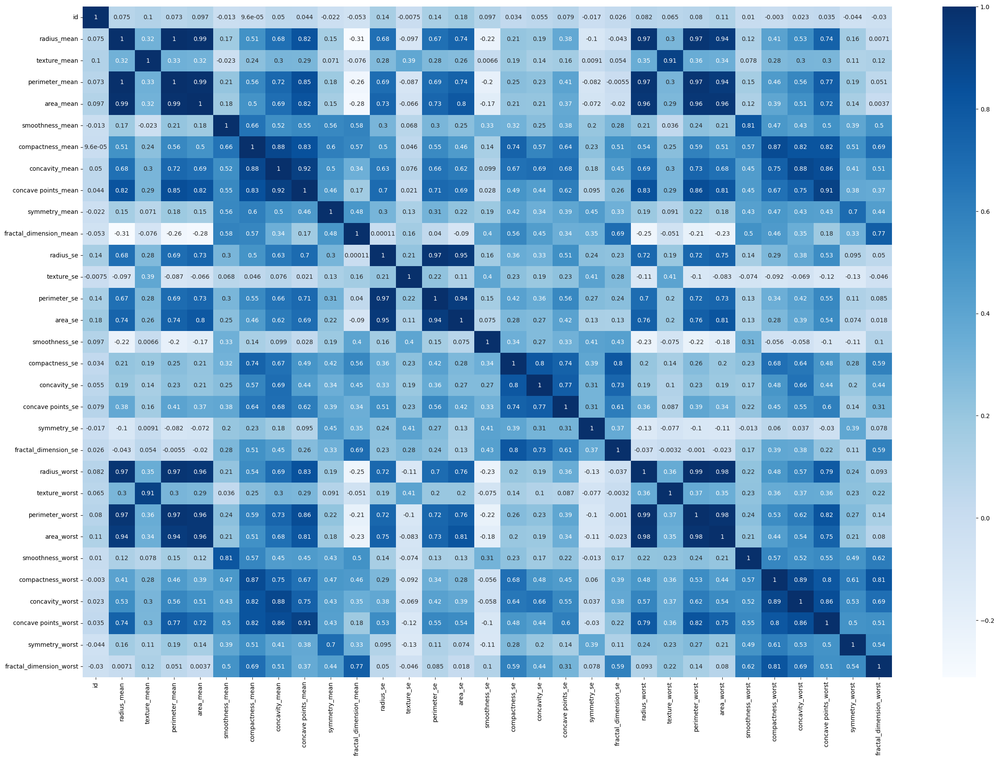

In [5]:
# memvisualisasikan korelasi antar variabel
corr=plt.figure(figsize=(30,20))
sns.heatmap(df_corr.corr(),annot=True,cmap='Blues')

berdasarkan gambar diatas bahwa Fitur radius, perimeter dan area memiliki korelasi sangat kuat satu sama lain, yang menunjukkan bahwa ketika satu nilai meningkat, yang lain juga cenderung meningkat.

In [6]:
# drop data agar hanya satu bagian bagian field
df_mean = df.drop(columns=[col for col in df.columns if '_se' in col or '_worst' in col])
df_se = df.drop(columns=[col for col in df.columns if '_mean' in col or '_worst' in col])
df_worst = df.drop(columns=[col for col in df.columns if '_se' in col or '_mean' in col])

visualisasi pairplot pada field mean, standart error dan worst

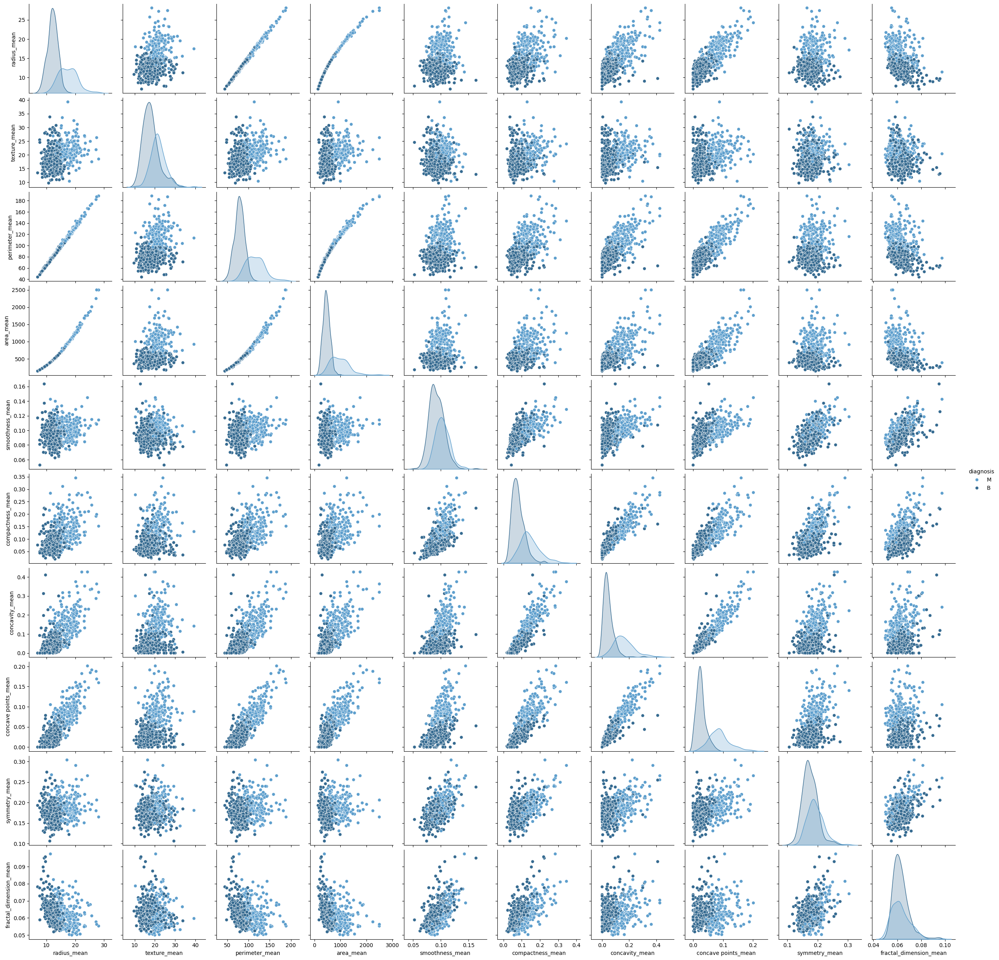

In [28]:
# membuat visualisasi pairplot untuk data df_mean 
sns.pairplot(df_mean, hue='diagnosis', palette='Blues_d')

berdasarkan gambar diatas bahwa beberapa korelasi positif terlihat kuat antara fitur seperti radius_mean, perimeter_mean, dan area_mean, terutama membedakan dua kelas diagnosis.

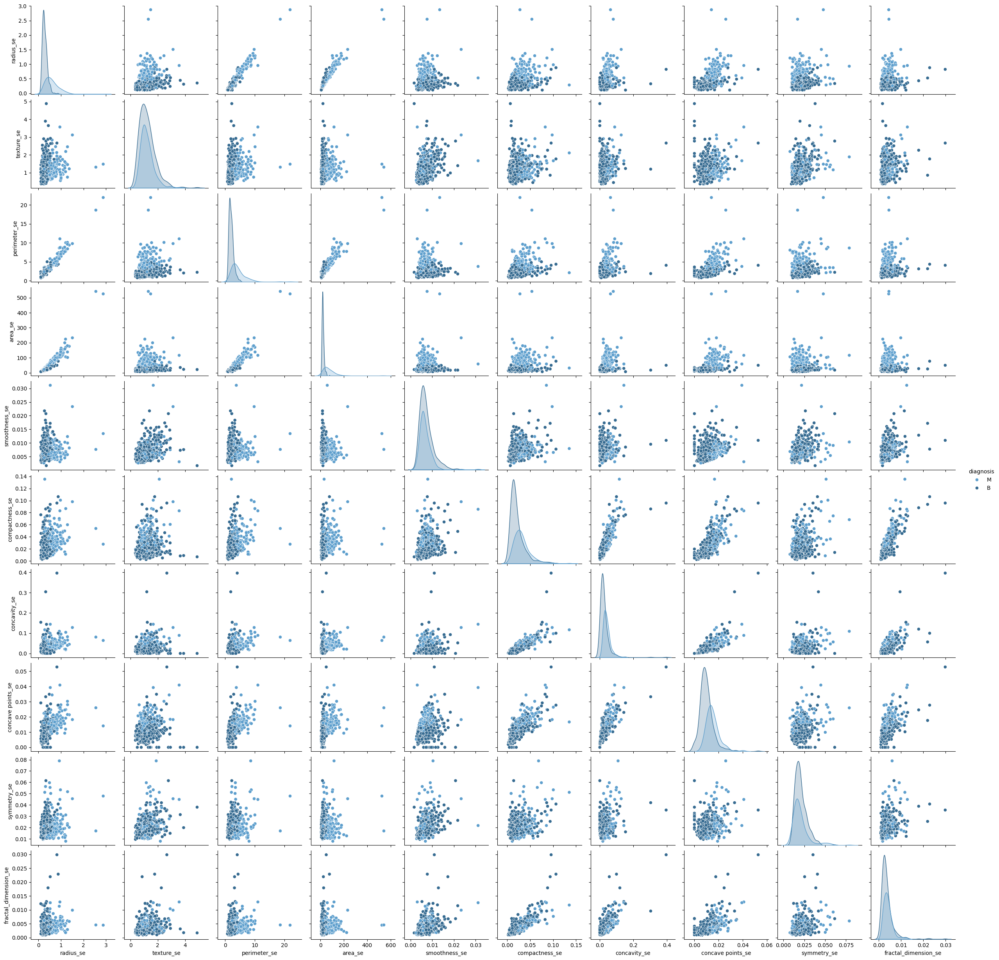

In [29]:
# membuat visualisasi pairplot untuk data df_se 
sns.pairplot(df_se, hue='diagnosis', palette='Blues_d')

berdasarkan gambar diatas bahwa sebagian besar fitur tidak memiliki korelasi yang kuat satu sama lain, kecuali beberapa fitur seperti radius_se, perimeter_se, dan area_se, yang menunjukkan korelasi lumayan kuat. Fitur-fitur ini masih cukup baik dalam memisahkan dua kelas diagnosis.

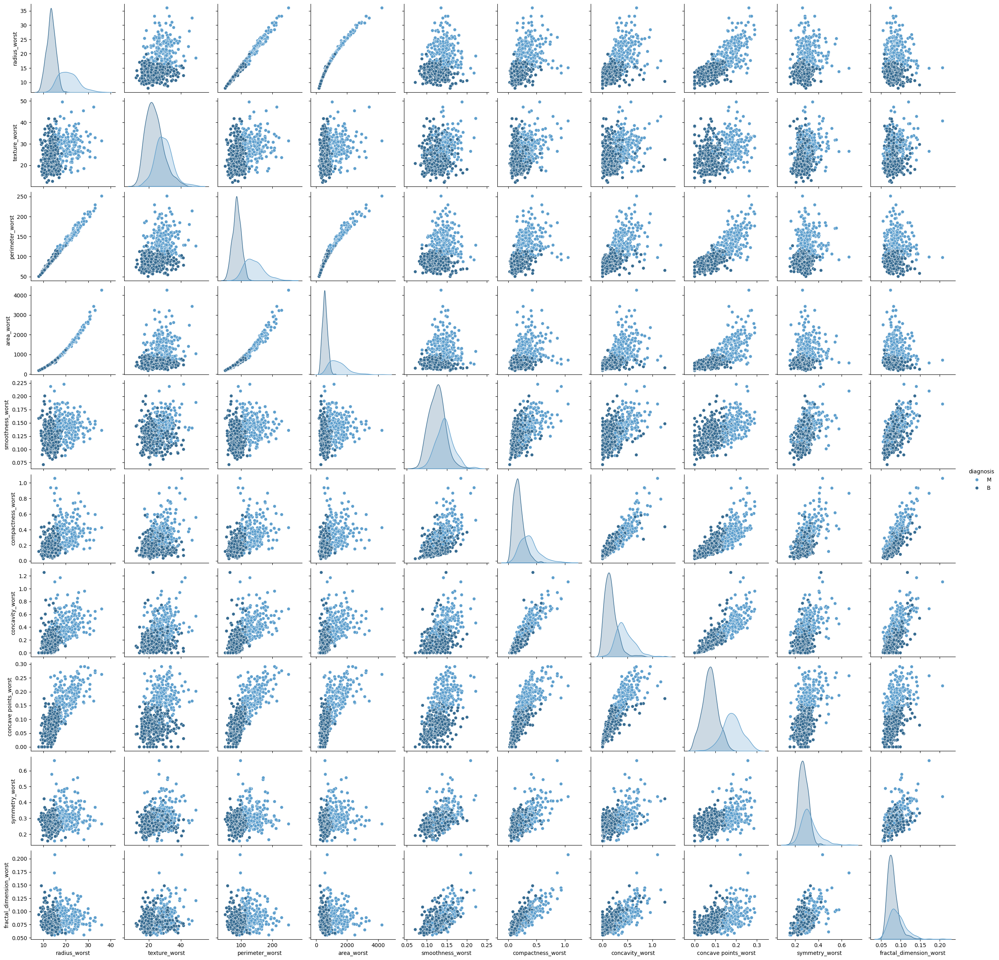

In [30]:
# membuat visualisasi pairplot untuk data df_worst 
sns.pairplot(df_worst, hue='diagnosis', palette='Blues_d')

berdasarkan gambar diatas bahwa ada beberapa korelasi yang sangat kuat antara fitur seperti radius_worst, perimeter_worst, dan area_worst.

mendeteksi outliers dengan visualisasi menggunakan boxplot pada field mean, standart error dan worst

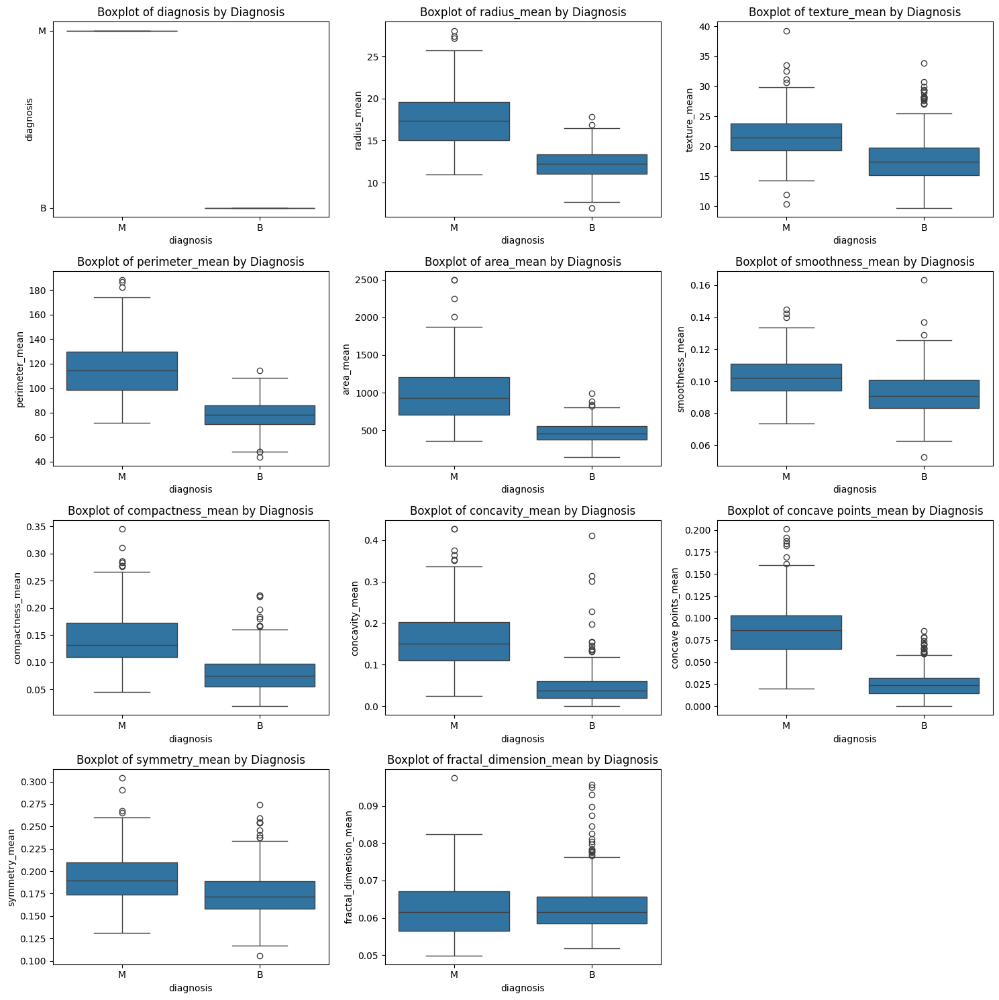

In [49]:
# membuat visualisasi boxplot menggunakan df_mean
n_cols = 3
n_rows = (len(df_mean.columns) + n_cols - 1) // n_cols  

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 15))  
axes = axes.flatten()  


for i, col in enumerate(df_mean.columns):
    sns.boxplot(x='diagnosis', y=col, data=df_mean, ax=axes[i])  
    axes[i].set_title(f'Boxplot of {col} by Diagnosis') 


for j in range(i + 1, n_rows * n_cols):
    fig.delaxes(axes[j])

plt.tight_layout()  
plt.show()  

berdasarkan gambar diatas bahwa terdapat banyak nilai outliers pada field mean.

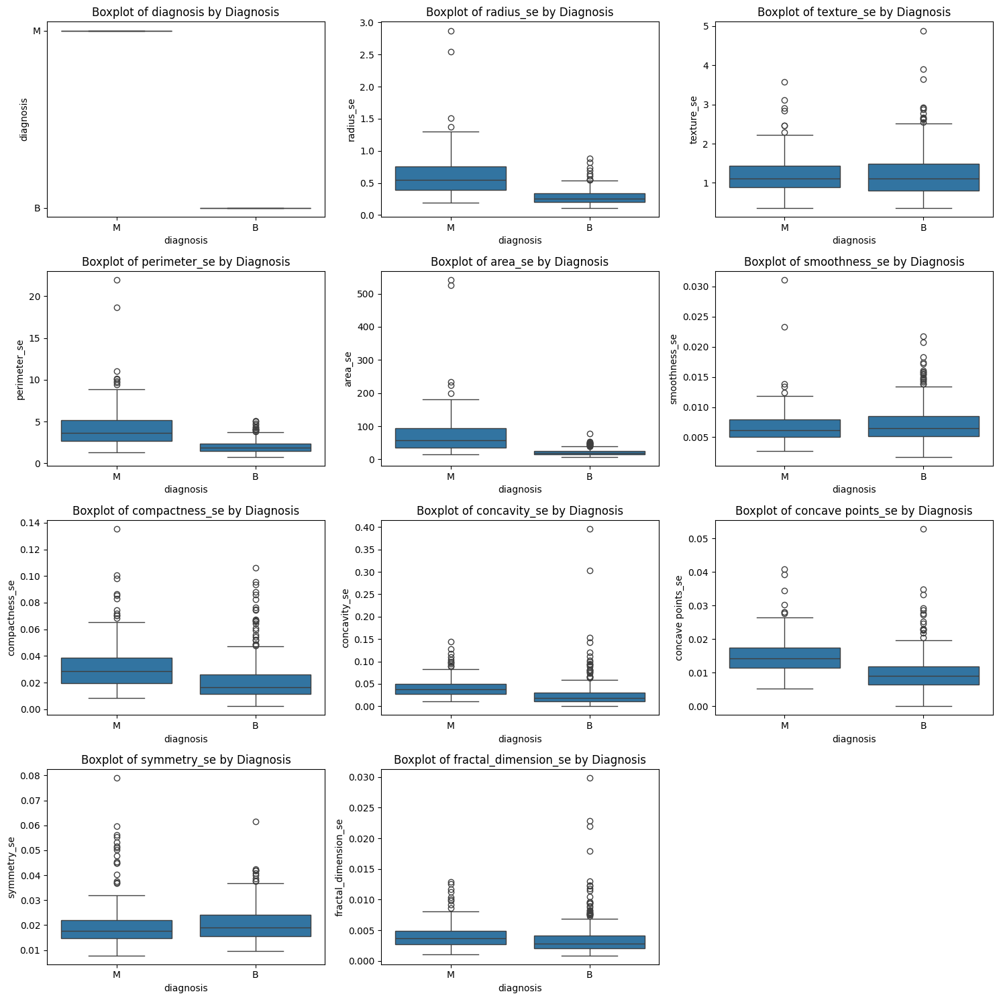

In [50]:
# membuat visualisasi boxplot menggunakan df_se
n_cols = 3
n_rows = (len(df_se.columns) + n_cols - 1) // n_cols  

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 15)) 
axes = axes.flatten()  


for i, col in enumerate(df_se.columns):
    sns.boxplot(x='diagnosis', y=col, data=df_se, ax=axes[i])  
    axes[i].set_title(f'Boxplot of {col} by Diagnosis') 


for j in range(i + 1, n_rows * n_cols):
    fig.delaxes(axes[j])

plt.tight_layout()  
plt.show()  

berdasarkan gambar diatas bahwa terdapat banyak nilai outliers pada field standart error.

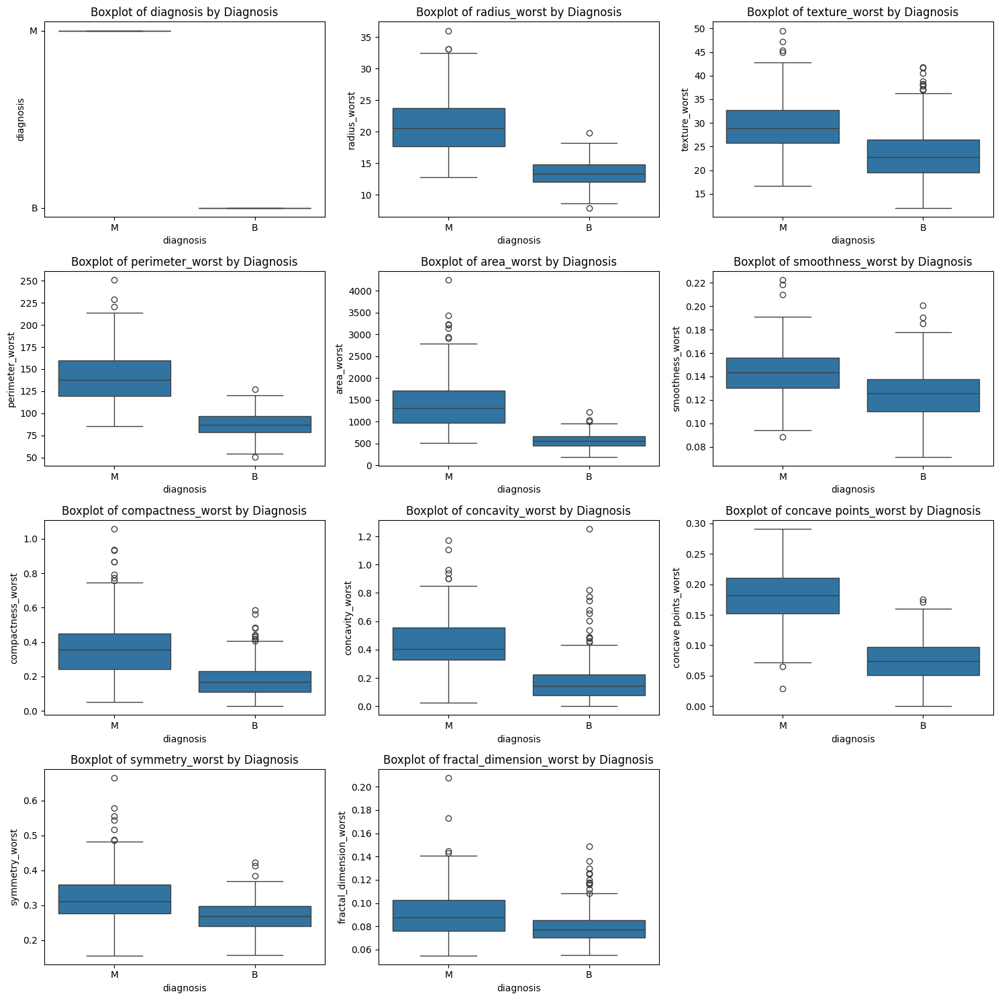

In [51]:
# membuat visualisasi boxplot menggunakan df_worst
n_cols = 3
n_rows = (len(df_worst.columns) + n_cols - 1) // n_cols  

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 15))  
axes = axes.flatten()  


for i, col in enumerate(df_worst.columns):
    sns.boxplot(x='diagnosis', y=col, data=df_worst, ax=axes[i])  
    axes[i].set_title(f'Boxplot of {col} by Diagnosis')  


for j in range(i + 1, n_rows * n_cols):
    fig.delaxes(axes[j])

plt.tight_layout()  
plt.show() 

berdasarkan gambar diatas bahwa terdapat banyak nilai outliers pada field worst.

### Data Preprocessing

label encoder fitur kategorikal

In [59]:
# melakukan labelencoder variabel diagnosis
from sklearn.preprocessing import LabelEncoder
l=LabelEncoder()
df['diagnosis']=l.fit_transform(df.diagnosis)
df.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


handling outliers dengan cara menghapus data yang tidak kurang dari batas bawah dan tidak lebih dari batas atas

In [60]:
# menghilangkan data outliers
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

df_clean = df[~((df < lower_bound) | (df > upper_bound)).any(axis=1)]


split data menjadi data train dan test

In [70]:
# membagi data menjadi train dan test menjadi 70:30
from sklearn.model_selection import train_test_split
x=df.drop('diagnosis',axis=1)
y=df['diagnosis']
xtrain,xtest,ytrain,ytest=train_test_split(x,y,test_size=0.3,random_state=42)

standart scaler data train dan test

In [71]:
# melakukan standard scaler
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
xtrain = scaler.fit_transform(xtrain)
xtest = scaler.transform(xtest)

### Modeling 

#### model development random forest 

membuat model random forest menggunakan 100 n_estimators dan dibatasi dengan kedalaman maksimum 3 untuk menjaga keseimbangan antara bias dan variansi.

In [90]:
from sklearn.ensemble import RandomForestClassifier
model_RandomForest = RandomForestClassifier(n_estimators=100, max_depth=3)
model_RandomForest.fit(xtrain, ytrain)
y_pred_RandomForest = model_RandomForest.predict(xtest)

#### model development adapative boosting

membuat model decision tree sebagai weak learners dengan kedalaman maksimum(max_depth) sebesar 3, yang berarti pohon keputusan dibatasi hingga tiga tingkat untuk mencegah overfitting.

In [80]:
from sklearn.tree import DecisionTreeClassifier

model_DecisionTree = DecisionTreeClassifier(max_depth=3)
model_DecisionTree.fit(xtrain, ytrain)
y_pred_DecisionTree = model_DecisionTree.predict(xtest)

membuat model adaboost dengan estimator berupa model Decision Tree yang memiliki kedalaman maksimum 3 dan jumlah estimators sebanyak 1000.

In [81]:
from sklearn.ensemble import AdaBoostClassifier

model_AdaBoost = AdaBoostClassifier(estimator=model_DecisionTree,n_estimators=1000)
model_AdaBoost.fit(xtrain, ytrain)
y_pred = model_AdaBoost.predict(xtest)


### Evaluation

hasil  classification report model decision tree

In [82]:
from sklearn.metrics import classification_report, confusion_matrix
# evaluasi hasil train model decision tree
print("Decision Tree")
print(classification_report(ytest, y_pred_DecisionTree))
print(confusion_matrix(ytest, y_pred_DecisionTree))

Decision Tree
              precision    recall  f1-score   support

           0       0.97      0.97      0.97       108
           1       0.95      0.95      0.95        63

    accuracy                           0.96       171
   macro avg       0.96      0.96      0.96       171
weighted avg       0.96      0.96      0.96       171

[[105   3]
 [  3  60]]


hasil  classification report model adaptive boosting

In [83]:
# evaluasi hasil train model adaptive boosting
print("Decision Tree + Adaboost")
print(classification_report(ytest, y_pred))
print(confusion_matrix(ytest, y_pred))

Decision Tree + Adaboost
              precision    recall  f1-score   support

           0       0.97      0.99      0.98       108
           1       0.98      0.95      0.97        63

    accuracy                           0.98       171
   macro avg       0.98      0.97      0.97       171
weighted avg       0.98      0.98      0.98       171

[[107   1]
 [  3  60]]


hasil  classification report model random forest

In [91]:
# evaluasi hasil train model random forest
print("Random Forest")
print(classification_report(ytest, y_pred_RandomForest))
print(confusion_matrix(ytest, y_pred_RandomForest))


Random Forest
              precision    recall  f1-score   support

           0       0.96      0.99      0.97       108
           1       0.98      0.92      0.95        63

    accuracy                           0.96       171
   macro avg       0.97      0.96      0.96       171
weighted avg       0.97      0.96      0.96       171

[[107   1]
 [  5  58]]


 Berdasarkan hasil classification report AdaBoost lebih unggul dalam hal menangani kesalahan prediksi dan akurasi pada dataset daripada Random Forest dengan metrik presisi 1%, akurasi, recall dan F1 score lebih tinggi 2%.